<h1>Objective</h1>
This dataset contains properties sold in New York City over a 12-month period from September 2016 to September 2017. The objective is to build a model to predict sale value in the future.

# Loading Dataset

In [0]:
#Download dataset
!wget -q https://www.dropbox.com/s/6tc7e6rc395c7jz/nyc-property-sales.zip

In [2]:
#Unzip the data
!unzip nyc-property-sales.zip > /dev/null; echo " done."

 done.


# Importing Modules

In [0]:
#Import basic packages

import pandas as pd 
pd.set_option('display.max_rows', 100)
pd.reset_option('display.max_rows')

import warnings
warnings.filterwarnings("ignore")
import time              
import numpy as np
import pickle

from sklearn.model_selection import train_test_split                            #splitting data
from pylab import rcParams
from sklearn.linear_model import LinearRegression                               #linear regression
from sklearn.metrics.regression import mean_squared_error                       #error metrics
from sklearn.metrics import mean_absolute_error

import seaborn as sns                                                           #visualisation
import matplotlib.pyplot as plt                                                 #visualisation

%matplotlib inline     
sns.set(color_codes=True)

# Exploaratory Data Analysis

 **Reading Data**

In [4]:
# Read data through Pandas and compute time taken to read

t_start = time.time()
df_prop = pd.read_csv('nyc-rolling-sales.csv')
t_end = time.time()
print('Time to Load Data: {} s'.format(t_end-t_start))                          # time [s]


Time to Load Data: 0.3043062686920166 s


In [5]:
df_prop.columns

Index(['Unnamed: 0', 'BOROUGH', 'NEIGHBORHOOD', 'BUILDING CLASS CATEGORY',
       'TAX CLASS AT PRESENT', 'BLOCK', 'LOT', 'EASE-MENT',
       'BUILDING CLASS AT PRESENT', 'ADDRESS', 'APARTMENT NUMBER', 'ZIP CODE',
       'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'TOTAL UNITS',
       'LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT',
       'TAX CLASS AT TIME OF SALE', 'BUILDING CLASS AT TIME OF SALE',
       'SALE PRICE', 'SALE DATE'],
      dtype='object')

In [6]:
df_prop.head(10)

,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,,10009,5,0,5,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00
1,5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,,10009,28,3,31,4616,18690,1900,2,C7,-,2016-12-14 00:00:00
2,6,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,,C7,197 EAST 3RD STREET,,10009,16,1,17,2212,7803,1900,2,C7,-,2016-12-09 00:00:00
3,7,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,,C4,154 EAST 7TH STREET,,10009,10,0,10,2272,6794,1913,2,C4,3936272,2016-09-23 00:00:00
4,8,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,,C2,301 EAST 10TH STREET,,10009,6,0,6,2369,4615,1900,2,C2,8000000,2016-11-17 00:00:00
5,9,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,405,16,,C4,516 EAST 12TH STREET,,10009,20,0,20,2581,9730,1900,2,C4,-,2017-07-20 00:00:00
6,10,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,406,32,,C4,210 AVENUE B,,10009,8,0,8,1750,4226,1920,2,C4,3192840,2016-09-23 00:00:00
7,11,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,407,18,,C7,520 EAST 14TH STREET,,10009,44,2,46,5163,21007,1900,2,C7,-,2017-07-20 00:00:00
8,12,1,ALPHABET CITY,08 RENTALS - ELEVATOR APARTMENTS,2,379,34,,D5,141 AVENUE D,,10009,15,0,15,1534,9198,1920,2,D5,-,2017-06-20 00:00:00
9,13,1,ALPHABET CITY,08 RENTALS - ELEVATOR APARTMENTS,2,387,153,,D9,629 EAST 5TH STREET,,10009,24,0,24,4489,18523,1920,2,D9,16232000,2016-11-07 00:00:00


In [7]:
#Let's have a look into the total number of columns and observations in the dataset
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 22 columns):
Unnamed: 0                        84548 non-null int64
BOROUGH                           84548 non-null int64
NEIGHBORHOOD                      84548 non-null object
BUILDING CLASS CATEGORY           84548 non-null object
TAX CLASS AT PRESENT              84548 non-null object
BLOCK                             84548 non-null int64
LOT                               84548 non-null int64
EASE-MENT                         84548 non-null object
BUILDING CLASS AT PRESENT         84548 non-null object
ADDRESS                           84548 non-null object
APARTMENT NUMBER                  84548 non-null object
ZIP CODE                          84548 non-null int64
RESIDENTIAL UNITS                 84548 non-null int64
COMMERCIAL UNITS                  84548 non-null int64
TOTAL UNITS                       84548 non-null int64
LAND SQUARE FEET                  84548 non-null object
GRO

In [8]:
#Let's look into summary statistics of data
df_prop.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,84548.0,10344.359878,7151.779436,4.0,4231.00,8942.0,15987.25,26739.0
BOROUGH,84548.0,2.998758,1.289790,1.0,2.00,3.0,4.00,5.0
BLOCK,84548.0,4237.218976,3568.263407,1.0,1322.75,3311.0,6281.00,16322.0
LOT,84548.0,376.224015,658.136814,1.0,22.00,50.0,1001.00,9106.0
ZIP CODE,84548.0,10731.991614,1290.879147,0.0,10305.00,11209.0,11357.00,11694.0
RESIDENTIAL UNITS,84548.0,2.025264,16.721037,0.0,0.00,1.0,2.00,1844.0
COMMERCIAL UNITS,84548.0,0.193559,8.713183,0.0,0.00,0.0,0.00,2261.0
TOTAL UNITS,84548.0,2.249184,18.972584,0.0,1.00,1.0,2.00,2261.0
YEAR BUILT,84548.0,1789.322976,537.344993,0.0,1920.00,1940.0,1965.00,2017.0
TAX CLASS AT TIME OF SALE,84548.0,1.657485,0.819341,1.0,1.00,2.0,2.00,4.0


**Observation:**
- There is a column called Unnamed: 0 which is not required as it contains only continuous index numbers
- The datatypes of saleprice is not correct because the summary statistics of sale price is not displayed

Hence there is a lot of data cleaning to perform.

**Statistical Insight Using Pandas profiling**

In [0]:
#Perform Pandas profiling to understand quick overview of columns

import pandas_profiling
report = pandas_profiling.ProfileReport(df_prop)
#covert profile report as html file
report.to_file("property_data.html")

In [10]:
from IPython.display import display,HTML,IFrame

display(HTML(open('property_data.html').read()))

Number of variables,22
Number of observations,84548
Total Missing (%),0.0%
Total size in memory,14.2 MiB
Average record size in memory,176.0 B
Numeric,10
Categorical,11
Boolean,0
Date,0
Text (Unique),0
Rejected,1


**Drop**: -> Either not important to be used ; no inherent information; High Correlated Values

- Address
- Appartment Number
- ID
- Easement
- ZIP
- Total Units Skewed: - > Not Done Anything so far; However - > We do Numerical Transformations like - LOG ; High skew to Normal Distribution
- COMMERCIAL UNITS
- RESIDENTIAL UNITS
- High Skewed
- RESIDENTIAL UNITS
- Commercial Units
- borough
- Queens seems to have huge skewed data in terms of total unit
- Total Units is skewed ( some large values)

**DataType Conversion:** From a value prospective (domain dependent)

- Tax Class at time of sale
- Tax class t present
- Land Square Feet
- Gross Square feet
- Sales Price
- Borough
- Sale Date

**Removal of Unnecesary Data:** Data where the ranges or values are not in accordance of Domain High Zero's: ( Non Availability of Data)

- Total Unit
- Year Built
- ZIP - removed
- GROSS SQUARE FEET
- LAND SQUARE FEET Dash Substitute ( Non Availability of Data) - Done
- Sales Price
- GROSS SQUARE FEET
- LAND SQUARE FEET Action: — Done
- Remove 0, - & 10 rows from Sales Price

**Outliers:** Values beyond particular domain range

- Remove everything beyond 90 percentile in Sales Column

**Feature Engineering :** Gives us new features from old data

- Extract individual time features from time column 

In [0]:
#This column has no significance other than being an iterator
del df_prop['Unnamed: 0']
#This column has no significant value
del df_prop['EASE-MENT']

**Observation:**

- From Pandas profiling we understand SALE PRICEcolumns have string value in some rows and thus has to be removed.
- From Pandas Profiling we understand LAND SQUARE FEET and GROSS SQUARE FEET columns have string values which have to replaced by appropriate values

In [0]:
df_prop['SALE PRICE'] = df_prop['SALE PRICE'].replace(' -  ',np.nan)
df_prop.dropna(inplace=True)

In [0]:
df_prop['LAND SQUARE FEET'] = df_prop['LAND SQUARE FEET'].replace(' -  ',np.nan)
df_prop['GROSS SQUARE FEET'] = df_prop['GROSS SQUARE FEET'].replace(' -  ',np.nan)

In [14]:
# count the number of NaN values in each column
print(df_prop.isnull().sum())

BOROUGH                               0
NEIGHBORHOOD                          0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
BUILDING CLASS AT PRESENT             0
ADDRESS                               0
APARTMENT NUMBER                      0
ZIP CODE                              0
RESIDENTIAL UNITS                     0
COMMERCIAL UNITS                      0
TOTAL UNITS                           0
LAND SQUARE FEET                  21188
GROSS SQUARE FEET                 21739
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                            0
SALE DATE                             0
dtype: int64


In [0]:
## Define a function impute_median and fill land square feet and gross square feet with median values
def impute_median(series):
    return series.fillna(series.median())

df_prop['LAND SQUARE FEET'] = df_prop['LAND SQUARE FEET'].transform(impute_median)
df_prop['GROSS SQUARE FEET'] = df_prop['GROSS SQUARE FEET'].transform(impute_median)

In [0]:
#Convert few column datatypes into appropriate ones for conserving memory

df_prop['TAX CLASS AT TIME OF SALE'] = df_prop['TAX CLASS AT TIME OF SALE'].astype('category')
df_prop['TAX CLASS AT PRESENT'] = df_prop['TAX CLASS AT PRESENT'].astype('category')
df_prop['LAND SQUARE FEET'] = pd.to_numeric(df_prop['LAND SQUARE FEET'], errors='coerce')
df_prop['GROSS SQUARE FEET']= pd.to_numeric(df_prop['GROSS SQUARE FEET'], errors='coerce')
df_prop['SALE PRICE'] = pd.to_numeric(df_prop['SALE PRICE'], errors='coerce')
df_prop['BOROUGH'] = df_prop['BOROUGH'].astype('category')

In [17]:
#The datatypes have now been changed
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69987 entries, 0 to 84547
Data columns (total 20 columns):
BOROUGH                           69987 non-null category
NEIGHBORHOOD                      69987 non-null object
BUILDING CLASS CATEGORY           69987 non-null object
TAX CLASS AT PRESENT              69987 non-null category
BLOCK                             69987 non-null int64
LOT                               69987 non-null int64
BUILDING CLASS AT PRESENT         69987 non-null object
ADDRESS                           69987 non-null object
APARTMENT NUMBER                  69987 non-null object
ZIP CODE                          69987 non-null int64
RESIDENTIAL UNITS                 69987 non-null int64
COMMERCIAL UNITS                  69987 non-null int64
TOTAL UNITS                       69987 non-null int64
LAND SQUARE FEET                  69987 non-null float64
GROSS SQUARE FEET                 69987 non-null float64
YEAR BUILT                        69987 non-null in

In [0]:
# Let's remove sale price with a nonsensically small dollar amount: $0 most commonly. 
# Since these sales are actually transfers of deeds between parties: for example, parents transferring ownership to their home to a child after moving out for retirement.

df_prop = df_prop[df_prop['SALE PRICE']!=0]

In [0]:
#Let's also remove observations that have gross square feet less than 400 sq. ft
#Let's also remove observations that have gross square feet less than 400 sq. ft
#Let's also remove observations that have sale price less than 1000 dollars


df_prop = df_prop[df_prop['GROSS SQUARE FEET']>400]   
df_prop = df_prop[df_prop['LAND SQUARE FEET']>400]
df_prop = df_prop[df_prop['SALE PRICE']>1000]


**Observation:**
- The most expensive property in NYC is a whopping 2 billion dollars which can be considered as an outlier.

In [20]:
df_prop[df_prop['SALE PRICE']==2210000000]

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
7447,1,MIDTOWN CBD,21 OFFICE BUILDINGS,4,1301,1,O4,245 PARK AVENUE,,10167,0,35,35,81336.0,1586886.0,1966,4,O4,2210000000,2017-05-05 00:00:00


In [21]:
#Let's also remove Outliers from the observations that have sale price greater than 99 percentile

q = df_prop["SALE PRICE"].quantile(0.99)
q

15276919.999999998

In [0]:
df_prop = df_prop[df_prop["SALE PRICE"] < q]
df_prop_lin = df_prop.copy()

In [0]:
# Convert sale date into time,month,year and day
df_prop['SALE DATE']=pd.to_datetime(df_prop['SALE DATE'])
df_prop['year']=df_prop['SALE DATE'].dt.year
df_prop['month']=df_prop['SALE DATE'].dt.month
df_prop['day']=df_prop['SALE DATE'].dt.day
df_prop['time']=df_prop['SALE DATE'].dt.hour
df_prop['day_week']=df_prop['SALE DATE'].dt.weekday_name

# Data Visualisation

In [0]:
#Assign numbered bouroughs to bourough names
dic = {1: 'Manhattan', 2: 'Bronx', 3: 'Brooklyn', 4: 'Queens', 5:'Staten Island'}
df_prop["borough_name"] = df_prop["BOROUGH"].apply(lambda x: dic[x])

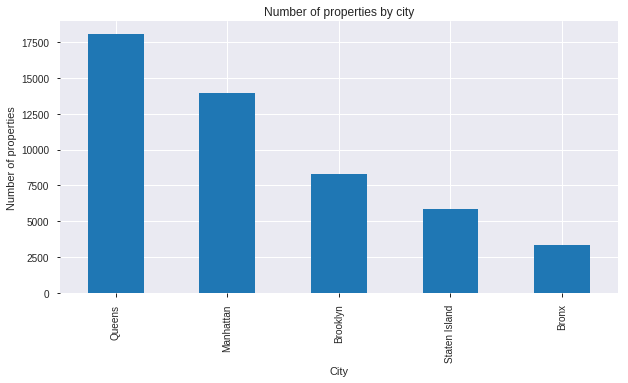

In [25]:
# Count of properties in NYC in each bororugh
%matplotlib inline
df_prop.borough_name.value_counts().nlargest(10).plot(kind='bar', figsize=(10,5))
plt.title("Number of properties by city")
plt.ylabel('Number of properties')
plt.xlabel('City');
plt.show()

In [26]:
# Distribution of Sale Price
df_prop['SALE PRICE'].describe()

count    4.950400e+04
mean     1.127438e+06
std      1.638281e+06
min      1.162000e+03
25%      4.024270e+05
50%      6.474200e+05
75%      1.100000e+06
max      1.527500e+07
Name: SALE PRICE, dtype: float64

**Observation:**
- The maximum sale price is 15 million

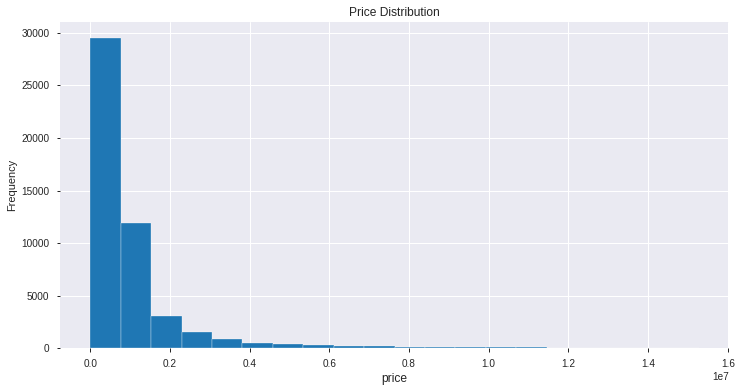

In [27]:
df_prop['SALE PRICE'].plot.hist(bins=20, figsize=(12, 6), edgecolor = 'white')
plt.xlabel('price', fontsize=12)
plt.title('Price Distribution', fontsize=12)
plt.show()

**Observation:**
- The distribution is highly skewed towards the right which implies there are lesser properties that have a very high prices.

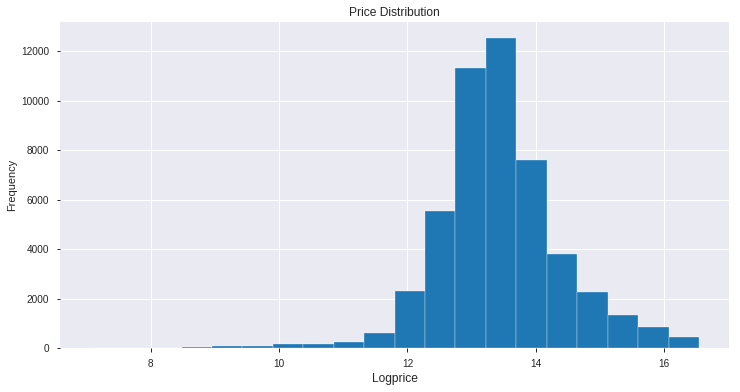

In [28]:
df_prop["log_price"] = np.log(df_prop["SALE PRICE"] + 1)
df_prop_lin["log_price"] = np.log(df_prop["SALE PRICE"] + 1)
df_prop["log_price"].plot.hist(bins=20, figsize=(12, 6), edgecolor = 'white')
plt.xlabel('Logprice', fontsize=12)
plt.title('Price Distribution', fontsize=12)
plt.show()

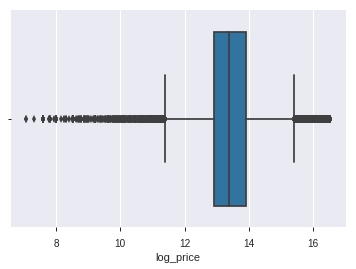

In [29]:
df_prop["log_price"] = np.log(df_prop["SALE PRICE"] + 1)
sns.boxplot(df_prop.log_price)

In [30]:
#skewness and kurtosis
print("Skewness: %f" % df_prop['SALE PRICE'].skew())
print("Kurtosis: %f" % df_prop['SALE PRICE'].kurt())

Skewness: 4.322486
Kurtosis: 23.126278


In [31]:
#skewness and kurtosis
print("Skewness: %f" % df_prop['log_price'].skew())
print("Kurtosis: %f" % df_prop['log_price'].kurt())

Skewness: -0.157881
Kurtosis: 2.857143


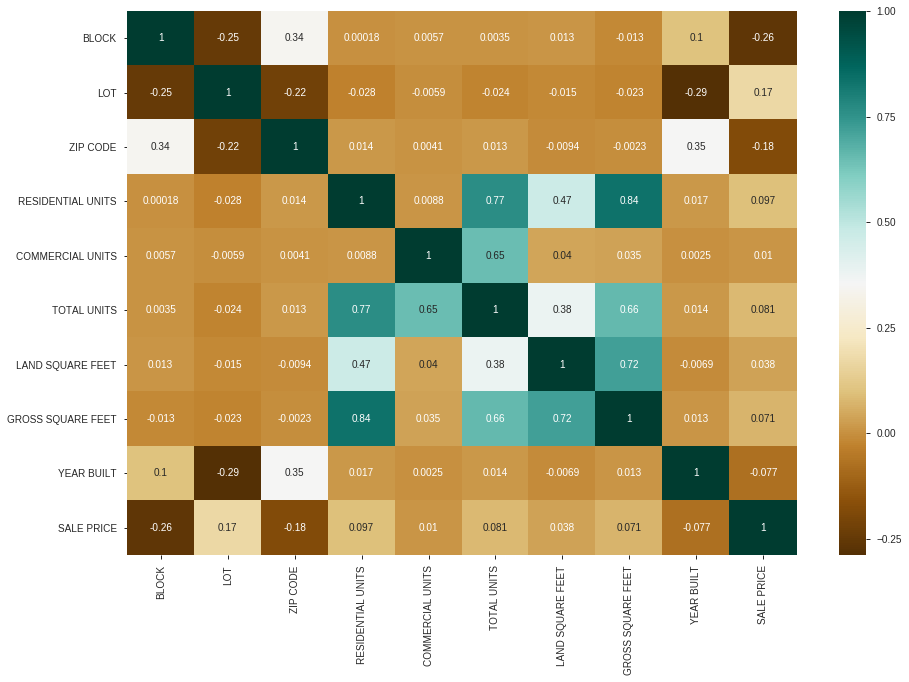

In [32]:
# Co-relation Heat Map
plt.figure(figsize=(15,10))
c = df_prop[df_prop.columns.values[0:19]].corr()
sns.heatmap(c,cmap="BrBG",annot=True)

**Observation:**
- The heat map illustrates that sale price is independent of all column values that could be considered for linear regression.

In [0]:
# Installing Module
!pip -q install plotly-express

# Code for displaying plotly express plots inline in colab
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))
  
import plotly_express as px

In [34]:
configure_plotly_browser_state()
px.scatter(df_prop, x="GROSS SQUARE FEET", y="SALE PRICE", size ="TOTAL UNITS" ,color="borough_name",
           hover_data=["BUILDING CLASS CATEGORY","LOT"], log_x=True, size_max=60)

**Observation:**

- Properties with more total units do not fetch larger sales price
Properties in Staten Island have comparitively lesser sales price in comparison with other boroughs in New york city

In [35]:
configure_plotly_browser_state()
px.box(df_prop, x="borough_name", y="SALE PRICE", color="TAX CLASS AT TIME OF SALE",hover_data=['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY'],notched=True)

**Observation:**

- Manhatten has the highest priced properties that have a tax class 1 representing residential property of up to three units (such as one-,two-, and three-family homes and small stores or offices with one or two attached apartments) as compared to other boroughs.
- Properties in Staten Island have comparitively lesser sales price in comparison with other boroughs in New york city

In [36]:
configure_plotly_browser_state()
px.box(df_prop, x="SALE PRICE", notched=True, hover_data=['borough_name'], orientation='h')

In [37]:
configure_plotly_browser_state()
px.box(df_prop, x="day_week", y="SALE PRICE", color="TAX CLASS AT TIME OF SALE", notched=True)



**Observation:**

On *Saturdays* there are no sales for the tax class 4 which represents properties such as such as offices, factories, warehouses, garage buildings, etc.

# Model Building

In [38]:
df_prop_lin.columns

Index(['BOROUGH', 'NEIGHBORHOOD', 'BUILDING CLASS CATEGORY',
       'TAX CLASS AT PRESENT', 'BLOCK', 'LOT', 'BUILDING CLASS AT PRESENT',
       'ADDRESS', 'APARTMENT NUMBER', 'ZIP CODE', 'RESIDENTIAL UNITS',
       'COMMERCIAL UNITS', 'TOTAL UNITS', 'LAND SQUARE FEET',
       'GROSS SQUARE FEET', 'YEAR BUILT', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE DATE',
       'log_price'],
      dtype='object')

In [0]:
#Dropping few columns
del df_prop_lin['BUILDING CLASS AT PRESENT']
del df_prop_lin['BUILDING CLASS AT TIME OF SALE']
del df_prop_lin['NEIGHBORHOOD']
del df_prop_lin['ADDRESS']
del df_prop_lin['SALE DATE']
del df_prop_lin['APARTMENT NUMBER']
del df_prop_lin['RESIDENTIAL UNITS']
del df_prop_lin['COMMERCIAL UNITS']
del df_prop_lin['SALE PRICE']
del df_prop_lin['ZIP CODE']

In [40]:
#Select the variables to be one-hot encoded
one_hot_features = ['BOROUGH', 'BUILDING CLASS CATEGORY','TAX CLASS AT PRESENT','TAX CLASS AT TIME OF SALE']
# Convert categorical variables into dummy/indicator variables (i.e. one-hot encoding).
one_hot_encoded = pd.get_dummies(df_prop_lin[one_hot_features],drop_first=True)
one_hot_encoded.info(verbose=True, memory_usage=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49504 entries, 0 to 84547
Data columns (total 59 columns):
BOROUGH_2                                                               49504 non-null uint8
BOROUGH_3                                                               49504 non-null uint8
BOROUGH_4                                                               49504 non-null uint8
BOROUGH_5                                                               49504 non-null uint8
BUILDING CLASS CATEGORY_02 TWO FAMILY DWELLINGS                         49504 non-null uint8
BUILDING CLASS CATEGORY_03 THREE FAMILY DWELLINGS                       49504 non-null uint8
BUILDING CLASS CATEGORY_04 TAX CLASS 1 CONDOS                           49504 non-null uint8
BUILDING CLASS CATEGORY_05 TAX CLASS 1 VACANT LAND                      49504 non-null uint8
BUILDING CLASS CATEGORY_06 TAX CLASS 1 - OTHER                          49504 non-null uint8
BUILDING CLASS CATEGORY_07 RENTALS - WALKUP APARTMENTS

In [41]:
df_prop_lin.head(5)

,BOROUGH,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,log_price
0,1,07 RENTALS - WALKUP APARTMENTS,2A,392,6,5,1633.0,6440.0,1900,2,15.706361
3,1,07 RENTALS - WALKUP APARTMENTS,2B,402,21,10,2272.0,6794.0,1913,2,15.185745
4,1,07 RENTALS - WALKUP APARTMENTS,2A,404,55,6,2369.0,4615.0,1900,2,15.894952
6,1,07 RENTALS - WALKUP APARTMENTS,2B,406,32,8,1750.0,4226.0,1920,2,14.976422
11,1,08 RENTALS - ELEVATOR APARTMENTS,2B,400,21,10,3717.0,12350.0,2009,2,16.152497


In [42]:
one_hot_encoded.head(5)

,BOROUGH_2,BOROUGH_3,BOROUGH_4,BOROUGH_5,BUILDING CLASS CATEGORY_02 TWO FAMILY DWELLINGS,BUILDING CLASS CATEGORY_03 THREE FAMILY DWELLINGS,BUILDING CLASS CATEGORY_04 TAX CLASS 1 CONDOS,BUILDING CLASS CATEGORY_05 TAX CLASS 1 VACANT LAND,BUILDING CLASS CATEGORY_06 TAX CLASS 1 - OTHER,BUILDING CLASS CATEGORY_07 RENTALS - WALKUP APARTMENTS,BUILDING CLASS CATEGORY_08 RENTALS - ELEVATOR APARTMENTS,BUILDING CLASS CATEGORY_09 COOPS - WALKUP APARTMENTS,BUILDING CLASS CATEGORY_10 COOPS - ELEVATOR APARTMENTS,BUILDING CLASS CATEGORY_11 SPECIAL CONDO BILLING LOTS,BUILDING CLASS CATEGORY_11A CONDO-RENTALS,BUILDING CLASS CATEGORY_12 CONDOS - WALKUP APARTMENTS,BUILDING CLASS CATEGORY_13 CONDOS - ELEVATOR APARTMENTS,BUILDING CLASS CATEGORY_14 RENTALS - 4-10 UNIT,BUILDING CLASS CATEGORY_15 CONDOS - 2-10 UNIT RESIDENTIAL,BUILDING CLASS CATEGORY_16 CONDOS - 2-10 UNIT WITH COMMERCIAL UNIT,BUILDING CLASS CATEGORY_17 CONDO COOPS,BUILDING CLASS CATEGORY_21 OFFICE BUILDINGS,BUILDING CLASS CATEGORY_22 STORE BUILDINGS,BUILDING CLASS CATEGORY_23 LOFT BUILDINGS,BUILDING CLASS CATEGORY_26 OTHER HOTELS,BUILDING CLASS CATEGORY_27 FACTORIES,BUILDING CLASS CATEGORY_28 COMMERCIAL CONDOS,BUILDING CLASS CATEGORY_29 COMMERCIAL GARAGES,BUILDING CLASS CATEGORY_30 WAREHOUSES,BUILDING CLASS CATEGORY_31 COMMERCIAL VACANT LAND,BUILDING CLASS CATEGORY_32 HOSPITAL AND HEALTH FACILITIES,BUILDING CLASS CATEGORY_33 EDUCATIONAL FACILITIES,BUILDING CLASS CATEGORY_34 THEATRES,BUILDING CLASS CATEGORY_35 INDOOR PUBLIC AND CULTURAL FACILITIES,BUILDING CLASS CATEGORY_36 OUTDOOR RECREATIONAL FACILITIES,BUILDING CLASS CATEGORY_37 RELIGIOUS FACILITIES,BUILDING CLASS CATEGORY_38 ASYLUMS AND HOMES,BUILDING CLASS CATEGORY_41 TAX CLASS 4 - OTHER,BUILDING CLASS CATEGORY_42 CONDO CULTURAL/MEDICAL/EDUCATIONAL/ETC,BUILDING CLASS CATEGORY_43 CONDO OFFICE BUILDINGS,BUILDING CLASS CATEGORY_44 CONDO PARKING,BUILDING CLASS CATEGORY_45 CONDO HOTELS,BUILDING CLASS CATEGORY_46 CONDO STORE BUILDINGS,BUILDING CLASS CATEGORY_47 CONDO NON-BUSINESS STORAGE,BUILDING CLASS CATEGORY_48 CONDO TERRACES/GARDENS/CABANAS,BUILDING CLASS CATEGORY_49 CONDO WAREHOUSES/FACTORY/INDUS,TAX CLASS AT PRESENT_1,TAX CLASS AT PRESENT_1A,TAX CLASS AT PRESENT_1B,TAX CLASS AT PRESENT_1C,TAX CLASS AT PRESENT_2,TAX CLASS AT PRESENT_2A,TAX CLASS AT PRESENT_2B,TAX CLASS AT PRESENT_2C,TAX CLASS AT PRESENT_3,TAX CLASS AT PRESENT_4,TAX CLASS AT TIME OF SALE_2,TAX CLASS AT TIME OF SALE_3,TAX CLASS AT TIME OF SALE_4
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
11,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0


In [0]:
# Replacing categorical columns with dummies
fdf = df_prop_lin.drop(one_hot_features,axis=1)
fdf = pd.concat([fdf, one_hot_encoded] ,axis=1)

In [44]:
fdf.head(5)

,BLOCK,LOT,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,log_price,BOROUGH_2,BOROUGH_3,BOROUGH_4,BOROUGH_5,BUILDING CLASS CATEGORY_02 TWO FAMILY DWELLINGS,BUILDING CLASS CATEGORY_03 THREE FAMILY DWELLINGS,BUILDING CLASS CATEGORY_04 TAX CLASS 1 CONDOS,BUILDING CLASS CATEGORY_05 TAX CLASS 1 VACANT LAND,BUILDING CLASS CATEGORY_06 TAX CLASS 1 - OTHER,BUILDING CLASS CATEGORY_07 RENTALS - WALKUP APARTMENTS,BUILDING CLASS CATEGORY_08 RENTALS - ELEVATOR APARTMENTS,BUILDING CLASS CATEGORY_09 COOPS - WALKUP APARTMENTS,BUILDING CLASS CATEGORY_10 COOPS - ELEVATOR APARTMENTS,BUILDING CLASS CATEGORY_11 SPECIAL CONDO BILLING LOTS,BUILDING CLASS CATEGORY_11A CONDO-RENTALS,BUILDING CLASS CATEGORY_12 CONDOS - WALKUP APARTMENTS,BUILDING CLASS CATEGORY_13 CONDOS - ELEVATOR APARTMENTS,BUILDING CLASS CATEGORY_14 RENTALS - 4-10 UNIT,BUILDING CLASS CATEGORY_15 CONDOS - 2-10 UNIT RESIDENTIAL,BUILDING CLASS CATEGORY_16 CONDOS - 2-10 UNIT WITH COMMERCIAL UNIT,BUILDING CLASS CATEGORY_17 CONDO COOPS,BUILDING CLASS CATEGORY_21 OFFICE BUILDINGS,BUILDING CLASS CATEGORY_22 STORE BUILDINGS,BUILDING CLASS CATEGORY_23 LOFT BUILDINGS,BUILDING CLASS CATEGORY_26 OTHER HOTELS,BUILDING CLASS CATEGORY_27 FACTORIES,BUILDING CLASS CATEGORY_28 COMMERCIAL CONDOS,BUILDING CLASS CATEGORY_29 COMMERCIAL GARAGES,BUILDING CLASS CATEGORY_30 WAREHOUSES,BUILDING CLASS CATEGORY_31 COMMERCIAL VACANT LAND,BUILDING CLASS CATEGORY_32 HOSPITAL AND HEALTH FACILITIES,BUILDING CLASS CATEGORY_33 EDUCATIONAL FACILITIES,BUILDING CLASS CATEGORY_34 THEATRES,BUILDING CLASS CATEGORY_35 INDOOR PUBLIC AND CULTURAL FACILITIES,BUILDING CLASS CATEGORY_36 OUTDOOR RECREATIONAL FACILITIES,BUILDING CLASS CATEGORY_37 RELIGIOUS FACILITIES,BUILDING CLASS CATEGORY_38 ASYLUMS AND HOMES,BUILDING CLASS CATEGORY_41 TAX CLASS 4 - OTHER,BUILDING CLASS CATEGORY_42 CONDO CULTURAL/MEDICAL/EDUCATIONAL/ETC,BUILDING CLASS CATEGORY_43 CONDO OFFICE BUILDINGS,BUILDING CLASS CATEGORY_44 CONDO PARKING,BUILDING CLASS CATEGORY_45 CONDO HOTELS,BUILDING CLASS CATEGORY_46 CONDO STORE BUILDINGS,BUILDING CLASS CATEGORY_47 CONDO NON-BUSINESS STORAGE,BUILDING CLASS CATEGORY_48 CONDO TERRACES/GARDENS/CABANAS,BUILDING CLASS CATEGORY_49 CONDO WAREHOUSES/FACTORY/INDUS,TAX CLASS AT PRESENT_1,TAX CLASS AT PRESENT_1A,TAX CLASS AT PRESENT_1B,TAX CLASS AT PRESENT_1C,TAX CLASS AT PRESENT_2,TAX CLASS AT PRESENT_2A,TAX CLASS AT PRESENT_2B,TAX CLASS AT PRESENT_2C,TAX CLASS AT PRESENT_3,TAX CLASS AT PRESENT_4,TAX CLASS AT TIME OF SALE_2,TAX CLASS AT TIME OF SALE_3,TAX CLASS AT TIME OF SALE_4
0,392,6,5,1633.0,6440.0,1900,15.706361,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
3,402,21,10,2272.0,6794.0,1913,15.185745,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
4,404,55,6,2369.0,4615.0,1900,15.894952,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
6,406,32,8,1750.0,4226.0,1920,14.976422,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
11,400,21,10,3717.0,12350.0,2009,16.152497,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0


In [45]:
fdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49504 entries, 0 to 84547
Data columns (total 66 columns):
BLOCK                                                                   49504 non-null int64
LOT                                                                     49504 non-null int64
TOTAL UNITS                                                             49504 non-null int64
LAND SQUARE FEET                                                        49504 non-null float64
GROSS SQUARE FEET                                                       49504 non-null float64
YEAR BUILT                                                              49504 non-null int64
log_price                                                               49504 non-null float64
BOROUGH_2                                                               49504 non-null uint8
BOROUGH_3                                                               49504 non-null uint8
BOROUGH_4                                       

In [46]:
#Standardize rows into uniform scale

X = fdf.drop(['log_price'],axis=1) 
y = fdf['log_price']

# [X,Y]  -> Feature Vector 

# Scale the values 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X)
fdf_normalized = scaler.transform(X)
# Scale and center the data


# Create a pandas DataFrame
fdf_normalized = pd.DataFrame(data=fdf_normalized, index=X.index, columns=X.columns)

fdf_normalized.head(5)



,BLOCK,LOT,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,BOROUGH_2,BOROUGH_3,BOROUGH_4,BOROUGH_5,BUILDING CLASS CATEGORY_02 TWO FAMILY DWELLINGS,BUILDING CLASS CATEGORY_03 THREE FAMILY DWELLINGS,BUILDING CLASS CATEGORY_04 TAX CLASS 1 CONDOS,BUILDING CLASS CATEGORY_05 TAX CLASS 1 VACANT LAND,BUILDING CLASS CATEGORY_06 TAX CLASS 1 - OTHER,BUILDING CLASS CATEGORY_07 RENTALS - WALKUP APARTMENTS,BUILDING CLASS CATEGORY_08 RENTALS - ELEVATOR APARTMENTS,BUILDING CLASS CATEGORY_09 COOPS - WALKUP APARTMENTS,BUILDING CLASS CATEGORY_10 COOPS - ELEVATOR APARTMENTS,BUILDING CLASS CATEGORY_11 SPECIAL CONDO BILLING LOTS,BUILDING CLASS CATEGORY_11A CONDO-RENTALS,BUILDING CLASS CATEGORY_12 CONDOS - WALKUP APARTMENTS,BUILDING CLASS CATEGORY_13 CONDOS - ELEVATOR APARTMENTS,BUILDING CLASS CATEGORY_14 RENTALS - 4-10 UNIT,BUILDING CLASS CATEGORY_15 CONDOS - 2-10 UNIT RESIDENTIAL,BUILDING CLASS CATEGORY_16 CONDOS - 2-10 UNIT WITH COMMERCIAL UNIT,BUILDING CLASS CATEGORY_17 CONDO COOPS,BUILDING CLASS CATEGORY_21 OFFICE BUILDINGS,BUILDING CLASS CATEGORY_22 STORE BUILDINGS,BUILDING CLASS CATEGORY_23 LOFT BUILDINGS,BUILDING CLASS CATEGORY_26 OTHER HOTELS,BUILDING CLASS CATEGORY_27 FACTORIES,BUILDING CLASS CATEGORY_28 COMMERCIAL CONDOS,BUILDING CLASS CATEGORY_29 COMMERCIAL GARAGES,BUILDING CLASS CATEGORY_30 WAREHOUSES,BUILDING CLASS CATEGORY_31 COMMERCIAL VACANT LAND,BUILDING CLASS CATEGORY_32 HOSPITAL AND HEALTH FACILITIES,BUILDING CLASS CATEGORY_33 EDUCATIONAL FACILITIES,BUILDING CLASS CATEGORY_34 THEATRES,BUILDING CLASS CATEGORY_35 INDOOR PUBLIC AND CULTURAL FACILITIES,BUILDING CLASS CATEGORY_36 OUTDOOR RECREATIONAL FACILITIES,BUILDING CLASS CATEGORY_37 RELIGIOUS FACILITIES,BUILDING CLASS CATEGORY_38 ASYLUMS AND HOMES,BUILDING CLASS CATEGORY_41 TAX CLASS 4 - OTHER,BUILDING CLASS CATEGORY_42 CONDO CULTURAL/MEDICAL/EDUCATIONAL/ETC,BUILDING CLASS CATEGORY_43 CONDO OFFICE BUILDINGS,BUILDING CLASS CATEGORY_44 CONDO PARKING,BUILDING CLASS CATEGORY_45 CONDO HOTELS,BUILDING CLASS CATEGORY_46 CONDO STORE BUILDINGS,BUILDING CLASS CATEGORY_47 CONDO NON-BUSINESS STORAGE,BUILDING CLASS CATEGORY_48 CONDO TERRACES/GARDENS/CABANAS,BUILDING CLASS CATEGORY_49 CONDO WAREHOUSES/FACTORY/INDUS,TAX CLASS AT PRESENT_1,TAX CLASS AT PRESENT_1A,TAX CLASS AT PRESENT_1B,TAX CLASS AT PRESENT_1C,TAX CLASS AT PRESENT_2,TAX CLASS AT PRESENT_2A,TAX CLASS AT PRESENT_2B,TAX CLASS AT PRESENT_2C,TAX CLASS AT PRESENT_3,TAX CLASS AT PRESENT_4,TAX CLASS AT TIME OF SALE_2,TAX CLASS AT TIME OF SALE_3,TAX CLASS AT TIME OF SALE_4
0,-1.040345,-0.505448,0.202608,-0.055074,0.185346,0.109153,-0.270532,-0.449434,-0.75697,-0.366001,-0.498175,-0.22129,-0.119936,-0.073222,-0.020104,5.304445,-0.046976,-0.203039,-0.46114,-0.004495,-0.008989,-0.076363,-0.421195,-0.081167,-0.071387,-0.019595,-0.1492,-0.057476,-0.096634,-0.017981,-0.038165,-0.044309,-0.013485,-0.061412,-0.05513,-0.0422,-0.021086,-0.022024,-0.006356,-0.016819,-0.008989,-0.035125,-0.016207,-0.019072,-0.004495,-0.06337,-0.041716,-0.03947,-0.029826,-0.028791,-0.004495,-0.004495,-1.003156,-0.118542,-0.07224,-0.017981,-0.801779,6.215699,-0.089111,-0.1058,0.0,-0.196367,1.123989,0.0,-0.19681
3,-1.037643,-0.481860,0.516855,-0.034468,0.202899,0.140189,-0.270532,-0.449434,-0.75697,-0.366001,-0.498175,-0.22129,-0.119936,-0.073222,-0.020104,5.304445,-0.046976,-0.203039,-0.46114,-0.004495,-0.008989,-0.076363,-0.421195,-0.081167,-0.071387,-0.019595,-0.1492,-0.057476,-0.096634,-0.017981,-0.038165,-0.044309,-0.013485,-0.061412,-0.05513,-0.0422,-0.021086,-0.022024,-0.006356,-0.016819,-0.008989,-0.035125,-0.016207,-0.019072,-0.004495,-0.06337,-0.041716,-0.03947,-0.029826,-0.028791,-0.004495,-0.004495,-1.003156,-0.118542,-0.07224,-0.017981,-0.801779,-0.160883,11.222002,-0.1058,0.0,-0.196367,1.123989,0.0,-0.19681
4,-1.037103,-0.428393,0.265457,-0.031340,0.094856,0.109153,-0.270532,-0.449434,-0.75697,-0.366001,-0.498175,-0.22129,-0.119936,-0.073222,-0.020104,5.304445,-0.046976,-0.203039,-0.46114,-0.004495,-0.008989,-0.076363,-0.421195,-0.081167,-0.0713

**Split the data into train and test**

In [0]:
X_train, X_test, y_train, y_test = train_test_split(X,y)

**Train the model**

In [0]:
# initialize the model
lr= LinearRegression()

# fit the model
model_fit=lr.fit(X_train,y_train)

In [49]:
from sklearn.externals import joblib 
  
# Save the model as a pickle in a file 
joblib.dump(model_fit, 'model.pkl') 

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning:

sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.



['model.pkl']

In [50]:
# Train Accuracy 

#predict on train data
train_pred = model_fit.predict(X_train)

#mean squared error
mse=mean_squared_error(y_train,train_pred)

#root mean squared error
print('train rmse: {}'.format(np.sqrt(mse)))

#mean absolute error
mae=mean_absolute_error(y_train,train_pred)
print('train mae: {}'.format(mae))

train rmse: 0.7219879243104649
train mae: 0.4879133728532081


**Test the model**

In [0]:
#predict on test data
test_pred = model_fit.predict(X_test)

In [52]:
#mean squared error
mse=mean_squared_error(y_test,test_pred)

#root mean squared error
print('test rmse: {}'.format(np.sqrt(mse)))

#mean absolute error
mae=mean_absolute_error(y_train,train_pred)
print('test mae: {}'.format(mae))

test rmse: 0.7249015056537917
test mae: 0.4879133728532081
